## ABIO558 Project (Revised Version)

### Project Goals:
1. Write markdown text describing the question and outlining your plan for analysis
2. Load data and write code
3. Visualization code

### Outline of Analysis Plan

In [1]:
# Research Question: How does EspM regulate whiB6 expression in the M. smegmatis strain MKD8?
# Data we have: RNA-seq data of the WT and espM deletion (KOespM) strains of MKD8
# Project Goal: To identify genes that are expressed differently when EspM is missing
# --> we want to make graphs or tables of significant changes in gene expression

# Plan for Analysis: Analyze MKD8 WT vs espM KO RNASeq data to determine gene expression differences
# --> conditions are WT and KOespM. Looking for significant changes in expression of genes in the whiB6 regulon
# (and/or anywhere else in the genome)

# Outline:

# Step 1: Pull out raw count data of each gene for each of the 4 samples

# Step 2: Normalize raw count data (each gene) to a factor that's the sum of the read counts per sample / the average of the 4 sums
# --> this factor is what every gene in each sample is divided by

# Step 3: Make Scatterplots

# Step 4: Make MA plots
# --> need log2 expression for M and ratio of KO/WT for A

# Step 1: Pull out the correct data columns

1) Import libraries
2) Find file path - check that it's correct
3) Load data with pandas
4) Pull out raw count columns for each of the 4 samples
5) Rename columns - Biorep 1 = OLD, Biorep 2 = NEW

In [2]:
# 1. Import Libraries

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import scanpy
import seaborn as sns
import skimage

In [3]:
# 2. Find file path

data_directory = 'C:/Users/denis/Downloads/'
filepath_mkd8 = os.path.join(data_directory, 'MKD8_KO_Rockhopper_data.csv')
os.path.exists(filepath_mkd8)

True

In [4]:
# 3. Load data with pandas

reads_df = pd.read_csv(filepath_mkd8, index_col=0)
reads_df.head()

,Translation Start,Translation Stop,Transcription Stop,Strand,Name,Synonym,Product,Raw Counts MKD8-oldmycospike,Normalized Counts MKD8-oldmycospike,RPKM MKD8-oldmycospike,...,pValue MKD8-oldmycospike vs KOespM-OLDmycospike,qValue MKD8-oldmycospike vs KOespM-OLDmycospike,pValue MKD8-oldmycospike vs KOespM-NEWmycospike,qValue MKD8-oldmycospike vs KOespM-NEWmycospike,pValue MKD8-NEWmycospike vs KOespM-OLDmycospike,qValue MKD8-NEWmycospike vs KOespM-OLDmycospike,pValue MKD8-NEWmycospike vs KOespM-NEWmycospike,qValue MKD8-NEWmycospike vs KOespM-NEWmycospike,pValue KOespM-OLDmycospike vs KOespM-NEWmycospike,qValue KOespM-OLDmycospike vs KOespM-NEWmycospike
Transcription Start,,,,,,,,,,,,,,,,,,,,,
NaN,1.0,1515.0,NaN,+,dnaA,MSMEI_0001,chromosomal replication initiator protein dnaA,4093.0,466488.0,232.0,...,0.047732,1.0,0.232398,1.0,0.048318,1.0,0.069294,1.0,7.290000e-21,4.220000e-19
NaN,1454.0,2071.0,2071.0,+,-,MSMEI_0002,hypothetical protein,1969.0,224415.0,274.0,...,0.658421,1.0,0.715949,1.0,0.665426,1.0,0.722310,1.0,1.092048e-02,5.016868e-02
2072.0,2109.0,3302.0,3302.0,+,dnaN,MSMEI_0003,DNA polymerase III subunit beta,13295.0,1515174.0,959.0,...,0.169175,1.0,0.213948,1.0,0.879587,1.0,0.287741,1.0,4.100000e-13,2.510000e-12
3303.0,3331.0,4224.0,4224.0,+,-,MSMEI_0004,6-phosphogluconate dehydrogenase,8056.0,918148.0,776.0,...,0.959884,1.0,0.349188,1.0,0.585358,1.0,0.751938,1.0,1.660000e-11,9.370000e-11
4225.0,4234.0,5388.0,NaN,+,recF,MSMEI_0005,DNA replication and repair protein RecF,3001.0,342014.0,223.0,...,0.428367,1.0,0.319915,1.0,0.677851,1.0,0.699315,1.0,2.010000e-17,2.650000e-16


In [5]:
# 4. Extract the raw count columns

raw_counts = pd.read_csv(filepath_mkd8, usecols=['Raw Counts MKD8-oldmycospike', 'Raw Counts MKD8-NEWmycospike', 'Raw Counts KOespM-OLDmycospike', 'Raw Counts KOespM-NEWmycospike'])
print(raw_counts)

      Raw Counts MKD8-oldmycospike  Raw Counts MKD8-NEWmycospike  \
0                           4093.0                        3700.0   
1                           1969.0                        1744.0   
2                          13295.0                        9364.0   
3                           8056.0                        5592.0   
4                           3001.0                        1928.0   
...                            ...                           ...   
6886                          75.0                          62.0   
6887                        4085.0                        3206.0   
6888                        9695.0                        8156.0   
6889                        7317.0                        6190.0   
6890                        2700.0                        2637.0   

      Raw Counts KOespM-OLDmycospike  Raw Counts KOespM-NEWmycospike  
0                             1442.0                          1604.0  
1                              749.0     

In [6]:
# 5. Rename the columns

raw_counts_renamed = raw_counts.rename(columns={'Raw Counts MKD8-oldmycospike': 'RC MKD8 WT1', 'Raw Counts MKD8-NEWmycospike': 'RC MKD8 WT2', 'Raw Counts KOespM-OLDmycospike': 'RC KOespM 1', 'Raw Counts KOespM-NEWmycospike': 'RC KOespM 2'})
raw_counts_renamed

,RC MKD8 WT1,RC MKD8 WT2,RC KOespM 1,RC KOespM 2
0,4093.0,3700.0,1442.0,1604.0
1,1969.0,1744.0,749.0,650.0
2,13295.0,9364.0,4701.0,4894.0
3,8056.0,5592.0,4026.0,3617.0
4,3001.0,1928.0,1513.0,1542.0
...,...,...,...,...
6886,75.0,62.0,27.0,30.0
6887,4085.0,3206.0,1239.0,1379.0
6888,9695.0,8156.0,3126.0,2869.0
6889,7317.0,6190.0,2875.0,3357.0


# Step 2: Normalize the data

1) Sum the raw counts of each sample
2) Average  of sums of the raw counts
3) Divide the column sums by the average - this is the correction factor
4) Divide each gene by the correction factor

In [7]:
# 1. Sum the raw counts of each sample

avg2 = raw_counts_renamed.sum(axis=0)
avg2

RC MKD8 WT1    8802709.0
RC MKD8 WT2    7064986.0
RC KOespM 1    7831718.0
RC KOespM 2    7363200.0
dtype: float64

In [8]:
# 2. Get average  of the sums of the raw counts

norm_avg = avg2[['RC MKD8 WT1', 'RC MKD8 WT2', 'RC KOespM 1', 'RC KOespM 2']].mean()
norm_avg

np.float64(7765653.25)

In [9]:
# 3. Divide the column sums by the average - this is the correction factor to normalize your genes to the average of each column/sample

correction_factor = avg2.div(norm_avg, axis=0)
correction_factor

RC MKD8 WT1    1.133544
RC MKD8 WT2    0.909774
RC KOespM 1    1.008507
RC KOespM 2    0.948175
dtype: float64

In [10]:
# 4. Divide each gene by the correction factor - these are your normalizes values

normalized_counts_corrected = raw_counts_renamed.div(correction_factor, axis=1)
normalized_counts_corrected

,RC MKD8 WT1,RC MKD8 WT2,RC KOespM 1,RC KOespM 2
0,3610.799670,4066.946067,1429.835955,1691.670444
1,1737.030186,1916.960524,742.681782,685.527300
2,11728.703057,10292.671073,4661.344539,5161.493237
3,7106.914767,6146.584434,3992.038526,3814.695758
4,2647.449257,2119.208653,1500.237032,1626.281686
...,...,...,...,...
6886,66.164177,68.148826,26.772240,31.639722
6887,3603.742158,3523.953808,1228.548369,1454.372533
6888,8552.822575,8964.868141,3099.630510,3025.812035
6889,6454.977079,6803.890852,2850.747830,3540.484838


# Step 3: Graphs!

1) Generate scatterplot
2) Generate MA plot

# Scatterplot

1. Average the normalized counts for each gene across the 2 Bioreps
2. Generate Scatter plot of WT vs. KO averaged normalized raw counts for the two conditions
3. Insert line of unity (to see where points deviate)

In [11]:
# 1. Average the normalized counts for each gene across the 2 Bioreps

# WT Normalized Average Counts
normalized_counts_corrected['Avg_Norm_WT'] = normalized_counts_corrected[['RC MKD8 WT1', 'RC MKD8 WT2']].mean(axis=1)
print(normalized_counts_corrected['Avg_Norm_WT'])

# KO Normalized Average Counts
normalized_counts_corrected['Avg_Norm_KOespM'] = normalized_counts_corrected[['RC KOespM 1', 'RC KOespM 2']].mean(axis=1)
print(normalized_counts_corrected['Avg_Norm_KOespM'])

0        3838.872868
1        1826.995355
2       11010.687065
3        6626.749601
4        2383.328955
            ...     
6886       67.156501
6887     3563.847983
6888     8758.845358
6889     6629.433966
6890     2640.216907
Name: Avg_Norm_WT, Length: 6891, dtype: float64
0       1560.753200
1        714.104541
2       4911.418888
3       3903.367142
4       1563.259359
           ...     
6886      29.205981
6887    1341.460451
6888    3062.721272
6889    3195.616334
6890    1403.428567
Name: Avg_Norm_KOespM, Length: 6891, dtype: float64


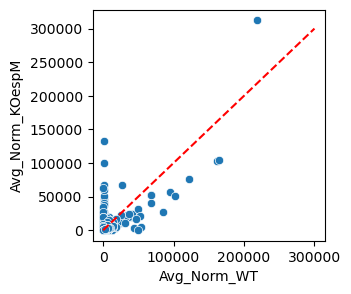

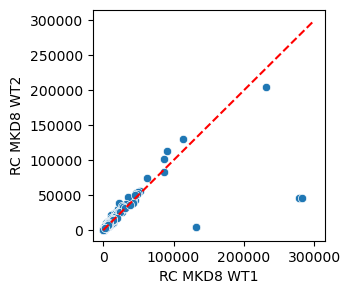

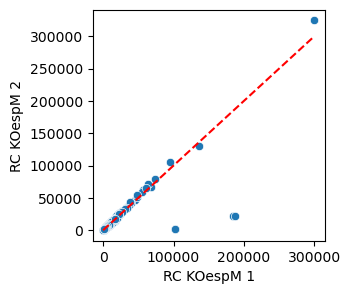

In [12]:
# 2. Generate a scatterplot of WT (x-axis) vs. KO (y-axis)

fh, ax = plt.subplots(1,1, figsize=(3,3))
sns.scatterplot(data=normalized_counts_corrected,
                x=normalized_counts_corrected['Avg_Norm_WT'],
                y=normalized_counts_corrected['Avg_Norm_KOespM'],
                ax=ax)

# 3. Insert the line of unity (y=x) to see where points (gene raw counts) deviate

min_val = 0
max_val = 300000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--', label='Line of Unity (y=x)')


# Plot WT1 vs WT2 - test to see how well the 2 bioreps align
fh, ax = plt.subplots(1,1, figsize=(3,3))
sns.scatterplot(data=normalized_counts_corrected,
                x='RC MKD8 WT1',
                y='RC MKD8 WT2',
                ax=ax)
# Plot the line of unity (y=x)
min_val = 0
max_val = 300000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--', label='Line of Unity (y=x)')


# Plot KO1 vs KO2 - test to see how well the 2 bioreps align
fh, ax = plt.subplots(1,1, figsize=(3,3))
sns.scatterplot(data=normalized_counts_corrected,
                x='RC KOespM 1',
                y='RC KOespM 2',
                ax=ax)
# Plot the line of unity (y=x)
min_val = 0
max_val = 300000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--', label='Line of Unity (y=x)')

In [13]:
# Note:the dots on the left side (KOs on y-axis) are the upregulated genes

# MA Plot

1) Calculate M --> log2 fold change of the "normalized_counts_log2" (represents the difference in expression between two samples)
2) Calculate A --> average intensity (mean expression) of the two samples
3) Create MA plot

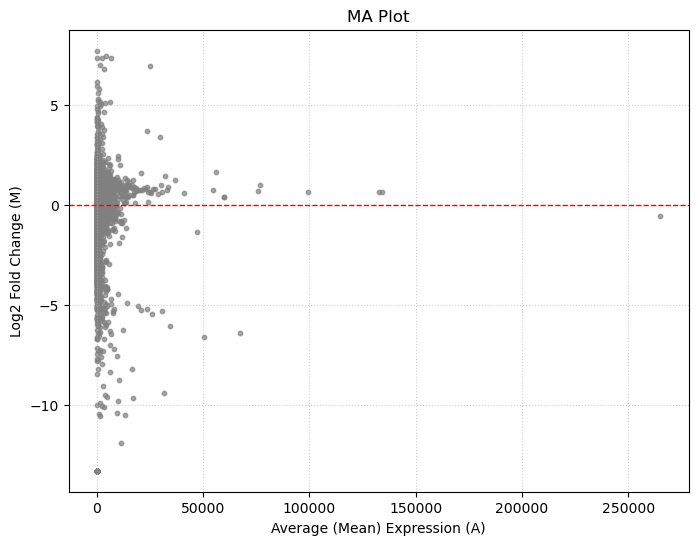

In [14]:
# 1. Calculate M --> "+0.0001" added to account for 0s
M = np.log2(normalized_counts_corrected['Avg_Norm_WT'] / normalized_counts_corrected['Avg_Norm_KOespM'] + 0.0001)

# 2. Calculate A
A = ((normalized_counts_corrected['Avg_Norm_WT']) + (normalized_counts_corrected['Avg_Norm_KOespM'])) / 2

# 3. Create the MA plot
plt.figure(figsize=(8, 6))
plt.scatter(A, M, s=10, alpha=0.7, color='gray')
plt.axhline(y=0, color='red', linestyle='--', linewidth=1) # Add a horizontal line at M=0
plt.xlabel("Average (Mean) Expression (A)")
plt.ylabel("Log2 Fold Change (M)")
plt.title("MA Plot")
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

# Note: Genes below the axis line are down regulated, above the line are upregulated

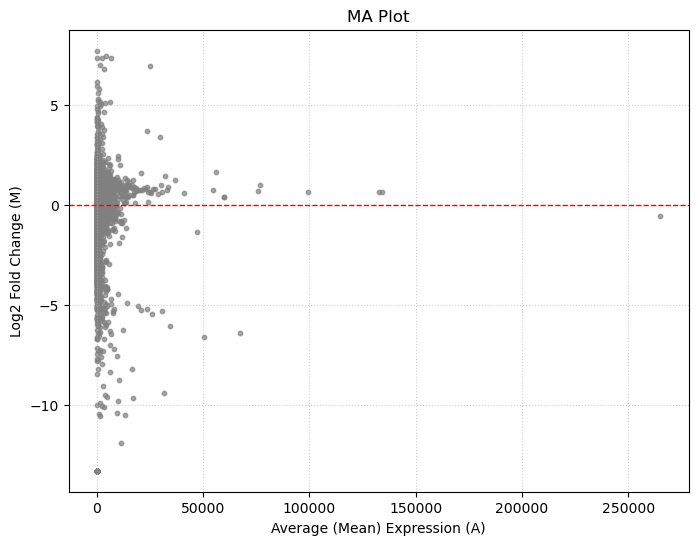

Text(570.6472496665451, inf, 'Specific Point')

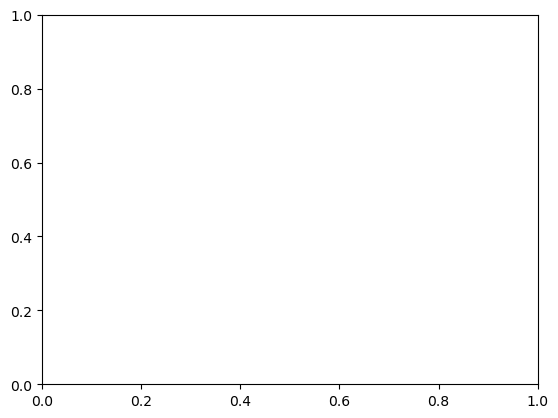

In [15]:
# Revision - Attempt to label espM (index = 55) on MA plot


x_values = ((normalized_counts_corrected['Avg_Norm_WT']) + (normalized_counts_corrected['Avg_Norm_KOespM'])) / 2
y_values = np.log2(normalized_counts_corrected['Avg_Norm_WT'] / normalized_counts_corrected['Avg_Norm_KOespM'] + 0.0001)

point_index = 55  # Index of the point to label
label_text = "Specific Point"

x_point = x_values[point_index]
y_point = y_values[point_index]

# 3. Create the MA plot
plt.figure(figsize=(8, 6))
plt.scatter(A, M, s=10, alpha=0.7, color='gray')
plt.axhline(y=0, color='red', linestyle='--', linewidth=1) # Add a horizontal line at M=0
plt.xlabel("Average (Mean) Expression (A)")
plt.ylabel("Log2 Fold Change (M)")
plt.title("MA Plot")
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

plt.annotate(
    label_text,               # The label text
    xy=(x_point, y_point),    # The point to annotate
    xytext=(x_point + 0.5, y_point + 1.0), # The position of the text (with an offset)
    arrowprops=dict(facecolor='black', shrink=0.05) # Optional: add an arrow
)

# Revision Feedback

- Labeling the genes and color-coding may help read the graphs better.

- For loading the data before graphing, I would make sure to label WT and MT samples, as well as labeling the genes, which was stated as a task for your next steps. I would further explain how the normalization of the data was performed.

- It would have been nice to have a point about what PyDeseq would have computed that you would not have been able to using your original methodology.

- See if you can get DESeq2 working so you can see annotated genes that are statistically significant across the data sets. Also if you can include lines or hue that indicate points that are significant genes in analysis for the MA.

- The metadata is a file with all the information. If you did the analysis in R, it would be a RDATA file. If you did the analysis in python it would be a h5 file. It is storing of the information in the same way as the CSV but in a format compatible with R and Python. It would be useful to discuss your criteria, the MA plot needs labeling, the PCA plot needs description. The choice of CPM as your quantification needs a rationale.

- - Plot visualizations: labels could be more informative
	- Find your genes of interest - is that really EspM?
-
- Include a threshold/cutoff for genes that are significant in the MA plot. Potentially also see if a volcano plot can be generated that way you can see the top 20 genes or so that may also be influenced.

- for code presentation...I would further zoom in and separate some slides that don't need to be together to be understood.

- PyDESeq2 probabaly needs a little more defining in the code with why you chose the parameters you chose.

NameError: name 'x' is not defined

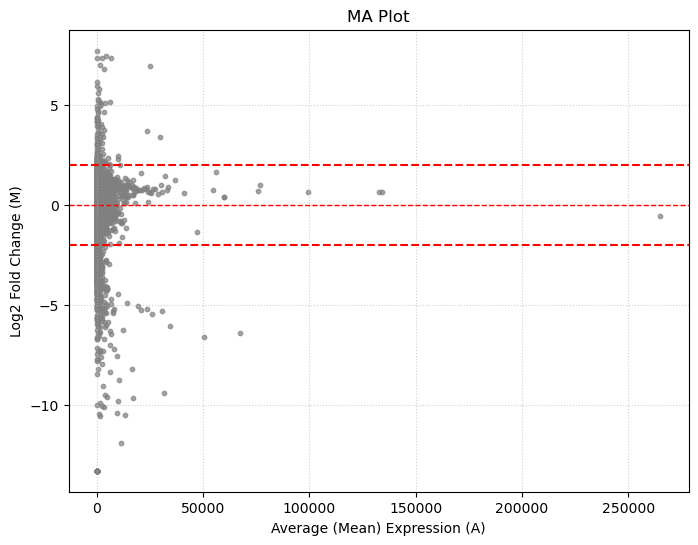

In [16]:
# Revision - attempt to add threshold lines on MA Plot

# Create the MA plot
plt.figure(figsize=(8, 6))
plt.scatter(A, M, s=10, alpha=0.7, color='gray')
plt.axhline(y=0, color='red', linestyle='--', linewidth=1) # Add a horizontal line at M=0
plt.xlabel("Average (Mean) Expression (A)")
plt.ylabel("Log2 Fold Change (M)")
plt.title("MA Plot")
plt.grid(True, linestyle=':', alpha=0.6)

# set horizontal thresholds
th1 = 2
th2 = -2

plt.axhline(th1, color='red', linestyle='--', linewidth=1.5)
plt.axhline(th2, color='red', linestyle='--', linewidth=1.5)

plt.text(x[0], th1, f'Threshold 1 = {th1}', color='red', va='bottom')
plt.text(x[0], th2, f'Threshold 2 = {th2}', color='red', va='bottom')

plt.show()

# Revision - Adding Genes Column

In [17]:
# pull out the synonyms column from the original file
synonyms = pd.read_csv(filepath_mkd8, usecols=['Synonym'])

# rename the synonym column to denote gene names
synonyms_renamed = synonyms.rename(columns={'Synonym':'Genes'})

# add the genes column to the normalized datatframe
df_new = normalized_counts_corrected.assign(genes=synonyms_renamed['Genes'])

# set the new genes column as the Index
df_new_indexed = df_new.set_index('genes')

print(df_new)

       RC MKD8 WT1   RC MKD8 WT2  RC KOespM 1  RC KOespM 2   Avg_Norm_WT  \
0      3610.799670   4066.946067  1429.835955  1691.670444   3838.872868   
1      1737.030186   1916.960524   742.681782   685.527300   1826.995355   
2     11728.703057  10292.671073  4661.344539  5161.493237  11010.687065   
3      7106.914767   6146.584434  3992.038526  3814.695758   6626.749601   
4      2647.449257   2119.208653  1500.237032  1626.281686   2383.328955   
...            ...           ...          ...          ...           ...   
6886     66.164177     68.148826    26.772240    31.639722     67.156501   
6887   3603.742158   3523.953808  1228.548369  1454.372533   3563.847983   
6888   8552.822575   8964.868141  3099.630510  3025.812035   8758.845358   
6889   6454.977079   6803.890852  2850.747830  3540.484838   6629.433966   
6890   2381.910361   2898.523454  1302.915704  1503.941430   2640.216907   

      Avg_Norm_KOespM          genes  
0         1560.753200     MSMEI_0001  
1        

In [18]:
# average the normalized counts for df_new_indexed for each gene across the 2 Bioreps

# WT Normalized Average Counts
df_new_indexed['Avg_Norm_WT'] = df_new_indexed[['RC MKD8 WT1', 'RC MKD8 WT2']].mean(axis=1)
print(df_new_indexed['Avg_Norm_WT'])

# KO Normalized Average Counts
df_new_indexed['Avg_Norm_KOespM'] = df_new_indexed[['RC KOespM 1', 'RC KOespM 2']].mean(axis=1)
print(df_new_indexed['Avg_Norm_KOespM'])

genes
MSMEI_0001        3838.872868
MSMEI_0002        1826.995355
MSMEI_0003       11010.687065
MSMEI_0004        6626.749601
MSMEI_0005        2383.328955
                     ...     
predicted RNA       67.156501
MSMEI_6749        3563.847983
MSMEI_6750        8758.845358
MSMEI_6751        6629.433966
MSMEI_6752        2640.216907
Name: Avg_Norm_WT, Length: 6891, dtype: float64
genes
MSMEI_0001       1560.753200
MSMEI_0002        714.104541
MSMEI_0003       4911.418888
MSMEI_0004       3903.367142
MSMEI_0005       1563.259359
                    ...     
predicted RNA      29.205981
MSMEI_6749       1341.460451
MSMEI_6750       3062.721272
MSMEI_6751       3195.616334
MSMEI_6752       1403.428567
Name: Avg_Norm_KOespM, Length: 6891, dtype: float64


In [19]:
# ISSUE WITH PLOTTING WITH GENES AS INDEX
# average the normalized counts for df_new for each gene across the 2 Bioreps

# WT Normalized Average Counts
df_new['Avg_Norm_WT'] = df_new[['RC MKD8 WT1', 'RC MKD8 WT2']].mean(axis=1)
print(df_new['Avg_Norm_WT'])

# KO Normalized Average Counts
df_new['Avg_Norm_KOespM'] = df_new[['RC KOespM 1', 'RC KOespM 2']].mean(axis=1)
print(df_new['Avg_Norm_KOespM'])

0        3838.872868
1        1826.995355
2       11010.687065
3        6626.749601
4        2383.328955
            ...     
6886       67.156501
6887     3563.847983
6888     8758.845358
6889     6629.433966
6890     2640.216907
Name: Avg_Norm_WT, Length: 6891, dtype: float64
0       1560.753200
1        714.104541
2       4911.418888
3       3903.367142
4       1563.259359
           ...     
6886      29.205981
6887    1341.460451
6888    3062.721272
6889    3195.616334
6890    1403.428567
Name: Avg_Norm_KOespM, Length: 6891, dtype: float64


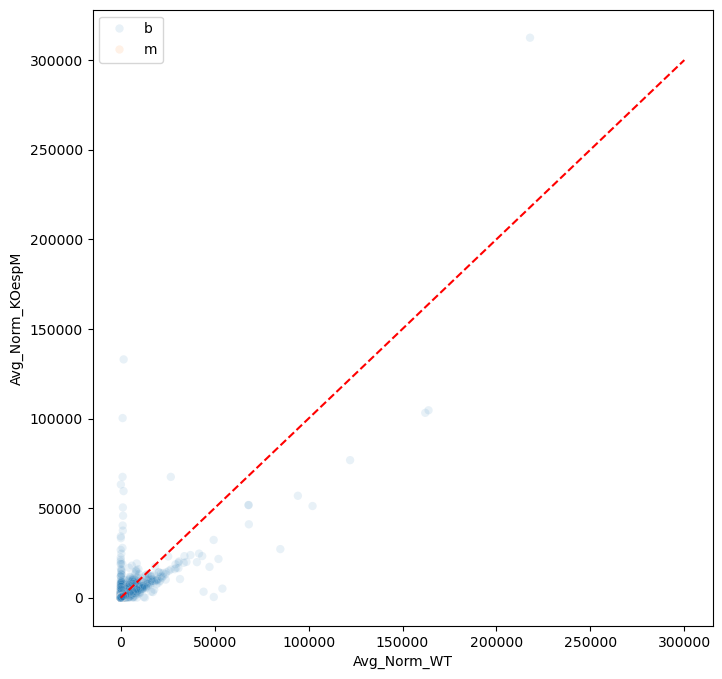

In [23]:
# Revision - attempted to make a scatterplot we can label with pandas

colors = ['b'] * len(df_new) # Start with all points blue
colors[55] = 'm' # Change the color of the point at index 55 to magenta - this should be espM

fh, ax = plt.subplots(1,1, figsize=(8,8))
sns.scatterplot(data=df_new,
                x=df_new['Avg_Norm_WT'],
                y=df_new['Avg_Norm_KOespM'],
                hue=colors,
                alpha=0.1,
                ax=ax)

# 3. Insert the line of unity (y=x) to see where points (gene raw counts) deviate
min_val = 0
max_val = 300000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--', label='Line of Unity (y=x)')

In [26]:
# Revision - second attempt to make a scatterplot we can label with pandas

fh, ax = plt.subplots(1,1, figsize=(8,8))
sns.scatterplot(data=df_new,
                x=df_new['Avg_Norm_WT'],
                y=df_new['Avg_Norm_KOespM'],
                hue='genes',
                palette='Pastel1',
                ax=ax)

# Overlay specific points with different colors using plt.scatter
plt.scatter(x=df_new['Avg_Norm_WT'].iloc[55], y=df_new['Avg_Norm_KOespM'].iloc[55], color='pink', s=100, label='whiB6')
plt.scatter(x=df_new['Avg_Norm_WT'].iloc[54], y=df_new['Avg_Norm_KOespM'].iloc[54], color='blue', s=100, label='espM')

# 3. Insert the line of unity (y=x) to see where points (gene raw counts) deviate
min_val = 0
max_val = 300000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--', label='Line of Unity (y=x)')

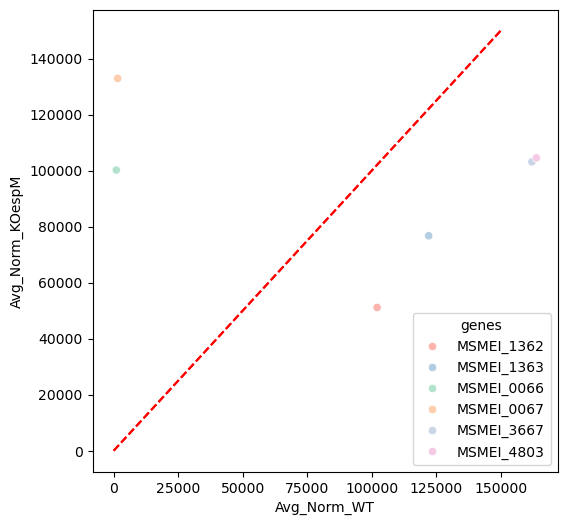

In [21]:
# Revision - build query of datatframe to set rawcount threshold, then do the new query df for the scatterplot
df_query = df_new.query('150000 > Avg_Norm_WT > 100000') 

# make a scatterplot we can label with pandas (WT)
fh, ax = plt.subplots(1,1, figsize=(6,6))
sns.scatterplot(data=df_query,
                x=df_query['Avg_Norm_WT'],
                y=df_query['Avg_Norm_KOespM'],
                hue='genes',
                palette='Pastel1',
                ax=ax)

# Insert the line of unity (y=x) to see where points (gene raw counts) deviate
min_val = 0
max_val = 150000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--')


# build query of datatframe to set rawcount threshold, then do the new query df for the scatterplot (KOespM)
df_query2 = df_new.query('150000 > Avg_Norm_KOespM > 100000')


# make a scatterplot we can label with pandas
sns.scatterplot(data=df_query2,
                x=df_query2['Avg_Norm_WT'],
                y=df_query2['Avg_Norm_KOespM'],
                hue='genes',
                palette='Pastel2',
                ax=ax)

# Insert the line of unity (y=x) to see where points (gene raw counts) deviate
min_val = 0
max_val = 150000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--')

# Note: can highlight genes most differentailly expressed b/w WT and KO
# Note: try adding plotly

# Overlay specific points with different colors using plt.scatter
# use boolian operatoers to find the index of your gene

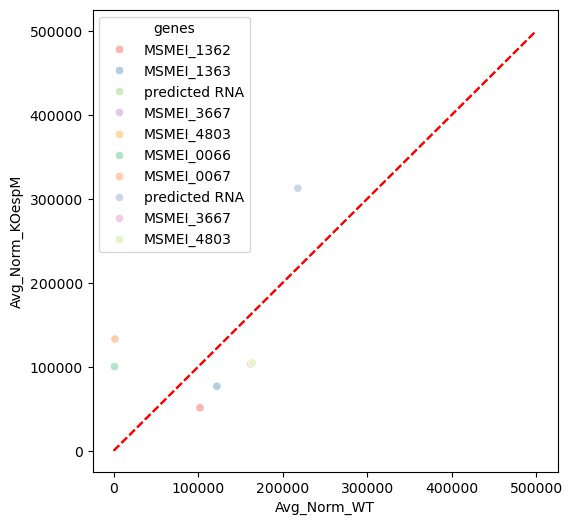

In [23]:
# build query of datatframe to set rawcount threshold, then do the new query df for the scatterplot
# Note: could also build a query with an OR statement
df_query = df_new.query('500000 > Avg_Norm_WT > 100000') 

# make a scatterplot we can label with pandas
fh, ax = plt.subplots(1,1, figsize=(6,6))
sns.scatterplot(data=df_query,
                x=df_query['Avg_Norm_WT'],
                y=df_query['Avg_Norm_KOespM'],
                hue='genes',
                palette='Pastel1',
                ax=ax)

# Insert the line of unity (y=x) to see where points (gene raw counts) deviate
min_val = 0
max_val = 500000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--')


# build query of datatframe to set rawcount threshold, then do the new query df for the scatterplot
# Note: could also build a query with an OR statement
df_query2 = df_new.query('500000 > Avg_Norm_KOespM > 100000')


# make a scatterplot we can label with pandas
sns.scatterplot(data=df_query2,
                x=df_query2['Avg_Norm_WT'],
                y=df_query2['Avg_Norm_KOespM'],
                hue='genes',
                palette='Pastel2',
                ax=ax)

# Insert the line of unity (y=x) to see where points (gene raw counts) deviate
min_val = 0
max_val = 500000
unity_line_values = np.linspace(min_val, max_val, 250) # Create values for the line
plt.plot(unity_line_values, unity_line_values, color='red', linestyle='--')

# Note: can highlight genes most differentailyl expressed b/w WT and KO
# Note: try adding plotly

# Overlay specific points with different colors using plt.scatter
# use boolian operatoers to find the index of your gene


In [43]:
# Revision - Volcano plot (attempt)

%pip install dash_bio

import dash_bio as dashbio

dashbio.VolcanoPlot(
    dataframe=df_new,
)

  Using cached dash_bio-1.0.2-py3-none-any.whl
  Using cached dash-3.3.0-py3-none-any.whl.metadata (11 kB)
  Using cached biopython-1.86-cp313-cp313-win_amd64.whl.metadata (13 kB)
  Using cached colour-0.1.5-py2.py3-none-any.whl.metadata (18 kB)
  Using cached GEOparse-2.0.4-py3-none-any.whl.metadata (6.5 kB)
  Using cached parmed-4.3.0.tar.gz (20.2 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached periodictable-2.0.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached retrying-1.4.2-py3-none-any.whl.metadata (5.5 kB)
Using cached biopython-1.86-cp313-cp313-win_amd64.whl (2.7 MB)
Using cached dash-3.3.0-py3-none-any.whl (7.9 MB)
Using cached GEOparse-2.0.4-py3-none-any.whl (29 kB)
Using cached colour-0.1.5-py2.py3-none-any.whl (23 kB)
Using cached periodictable-2.0.2-py3-none-any.whl (811 kB)
Using cached retrying-1.4.2-py3-none-any.whl (10 kB)
  Running setup.py clean for parmed
Failed to build parmed
Note: you may n

  DEPRECATION: Building 'parmed' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'parmed'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  error: subprocess-exited-with-error
  
  python setup.py bdist_wheel did not run successfully.
  exit code: 1
  
  [155 lines of output]
  running bdist_wheel
  running build
  running build_py
  creating build\lib.win-amd64-cpython-313\parmed
  copying parmed\constants.py -> build\lib.win-amd64-cpython-313\parmed
  copying parmed\exceptions.py -> build\lib.win-amd64-cpython-313\parmed
  copying parmed\geometry.py -> build\lib.win-amd64-cpython-313\parmed
  copying parmed\parameters.py -> build\lib.win-amd64-cpython-313\parmed
  copying

ModuleNotFoundError: No module named 'dash_bio'

In [44]:
# Revision - steps for Volcano Plot generation with sns and plt. P-value from DESeq2 analaysis is needed

# 1. Prepare data for plotting
# Calculate -log10(p-value) for the Y-axis
df_new['-log10(p-value)'] = -np.log10(df_new['P.Value'])

# Define significance thresholds
p_threshold = 0.05
fc_threshold = 1 # Absolute log2(Fold Change) threshold

# Create a 'significance' column for coloring points
df_new['significance'] = 'Not Significant'
df_new.loc[(df_new['P.Value'] < p_threshold) & (df_new['logFC'].abs() >= fc_threshold), 'significance'] = 'Significant'
df_new.loc[(df_new['P.Value'] < p_threshold) & (df_new['logFC'] >= fc_threshold), 'significance'] = 'Upregulated'
df_new.loc[(df_new['P.Value'] < p_threshold) & (df_new['logFC'] <= -fc_threshold), 'significance'] = 'Downregulated'

# 2. Create the plot using seaborn.scatterplot
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df_new,
    x='logFC',
    y='-log10(p-value)',
    hue='significance', # Color points based on significance
    palette={'Upregulated': 'red', 'Downregulated': 'blue', 'Not Significant': 'grey'},
    s=20, # Point size
    alpha=0.7 # Point transparency
)

KeyError: 'P.Value'

# Revision - (attempt) metadata loading

In [25]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

(from google gemini and chatgpt)

1. nf-core / Snakemake-compatible samplesheet.csv

sample,condition,replicate,fastq_1,fastq_2
MKD8_WT1,WT,1,MKD8-OLDmycospike_R1_concat.fastq,MKD8-OLDmycospike_R2_concat.fastq
MKD8_WT2,WT,2,MKD8-NEWmycospike_R1_concat.fastq,MKD8-NEWmycospike_R2_concat.fastq
KOespM_1,KO,1,KOespM-OLDmycospike_R1_concat.fastq,KOespM-OLDmycospike_R2_concat.fastq
KOespM_2,KO,2,KOespM-NEWmycospike_R1_concat.fastq,KOespM-NEWmycospike_R2_concat.fastq

2. DESeq2 metadata (simple design matrix)

sample,condition,replicate
MKD8_WT1,WT,1
MKD8_WT2,WT,2
KOespM_1,KO,1
KOespM_2,KO,2

## Points to Try

- Labeling the genes and color-coding may help read the graphs better
- - For loading the data before graphing, I would make sure to label WT and MT samples, as well as labeling the genes, which was stated as a task for your next steps. I would further explain how the normalization of the data was performed.
- It would have been nice to have a point about what PyDeseq would have computed that you would not have been able to using your original methodology.
- See if you can get DESeq2 working so you can see annotated genes that are statistically significant across the data sets. Also if you can include lines or hue that indicate points that are significant genes in analysis for the MA.
- - - Plot visualizations: labels could be more informative
	- Find your genes of interest - is that really EspM?